In [1]:
import numpy as np
import pandas as pd
from pandas import DataFrame as df
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

df = pd.read_csv('Results_21Mar2022.csv')
df_nokcaladjust = pd.read_csv('Results_21MAR2022_nokcaladjust.csv')

In [2]:
with pd.option_context('display.max_info_columns', 100):
    df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72000 entries, 0 to 71999
Data columns (total 24 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   mc_run_id       72000 non-null  int64  
 1   grouping        72000 non-null  object 
 2   mean_ghgs       72000 non-null  float64
 3   mean_land       72000 non-null  float64
 4   mean_watscar    72000 non-null  float64
 5   mean_eut        72000 non-null  float64
 6   mean_ghgs_ch4   72000 non-null  float64
 7   mean_ghgs_n2o   72000 non-null  float64
 8   mean_bio        72000 non-null  float64
 9   mean_watuse     72000 non-null  float64
 10  mean_acid       72000 non-null  float64
 11  sd_ghgs         72000 non-null  float64
 12  sd_land         72000 non-null  float64
 13  sd_watscar      72000 non-null  float64
 14  sd_eut          72000 non-null  float64
 15  sd_ghgs_ch4     72000 non-null  float64
 16  sd_ghgs_n2o     72000 non-null  float64
 17  sd_bio          72000 non-null 

In [3]:
mean_label = ['mean_ghgs', 'mean_land', 'mean_watscar', 'mean_eut',
              'mean_ghgs_ch4', 'mean_ghgs_n2o', 'mean_bio', 'mean_watuse', 'mean_acid']
std_label = ['sd_ghgs', 'sd_land', 'sd_watscar', 'sd_eut',
             'sd_ghgs_ch4', 'sd_ghgs_n2o', 'sd_bio', 'sd_watuse', 'sd_acid']

In [4]:
# Create a DataFrame to store the Monte Carlo diet group results
weighted = df.copy()

agg_result = []

# Iterate over each combination of mc_run_id and diet_group
for (mc_id, diet), group in weighted.groupby(['mc_run_id', 'diet_group']):
    n_total = group['n_participants'].sum()

    # Weighted mean
    weighted_means = {
        label: np.average(group[label], weights=group['n_participants'])
        for label in mean_label
    }

    # Pooled standard deviation
    pooled_stds = {}
    for m_label, s_label in zip(mean_label, std_label):
        means = group[m_label]
        stds = group[s_label]
        ns = group['n_participants']

        # Squared deviation between group mean and overall mean
        group_mean = weighted_means[m_label]
        squared_diffs = (means - group_mean) ** 2

        # Within-group variance + between-group variance
        pooled_var = (
            ((ns - 1) * stds ** 2).sum() + (ns * squared_diffs).sum()
        ) / (ns.sum() - 1)

        pooled_stds[s_label] = np.sqrt(pooled_var)

    # Merge results
    row = {
        'mc_run_id': mc_id,
        'diet_group': diet,
        **weighted_means,
        **pooled_stds,
        'n_total': n_total
    }
    agg_result.append(row)

# Final aggregated result as DataFrame
agg_df = pd.DataFrame(agg_result)

In [8]:
with pd.option_context('display.max_info_columns', 100):
    agg_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6000 entries, 0 to 5999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   mc_run_id      6000 non-null   int64  
 1   diet_group     6000 non-null   object 
 2   mean_ghgs      6000 non-null   float64
 3   mean_land      6000 non-null   float64
 4   mean_watscar   6000 non-null   float64
 5   mean_eut       6000 non-null   float64
 6   mean_ghgs_ch4  6000 non-null   float64
 7   mean_ghgs_n2o  6000 non-null   float64
 8   mean_bio       6000 non-null   float64
 9   mean_watuse    6000 non-null   float64
 10  mean_acid      6000 non-null   float64
 11  sd_ghgs        6000 non-null   float64
 12  sd_land        6000 non-null   float64
 13  sd_watscar     6000 non-null   float64
 14  sd_eut         6000 non-null   float64
 15  sd_ghgs_ch4    6000 non-null   float64
 16  sd_ghgs_n2o    6000 non-null   float64
 17  sd_bio         6000 non-null   float64
 18  sd_watus

In [9]:
# Group by diet type and calculate means/standard deviation of environmental metrics
diet_means = agg_df.groupby('diet_group')[mean_label].mean().reset_index()
diet_std = agg_df.groupby('diet_group')[std_label].std().reset_index()

In [10]:
# Paletton Colormap
paletton_color = {'fish':'#41908D','meat':'#E99EB6','meat100':'#BB335E','meat50':'#FFD1AD','vegan':'#529515','veggie':'#C3EA9F'}

In [12]:
# Correlation Heatmap
corr_matrix = diet_means[mean_label].corr()

#Add an upper triangle mask
masked_corr = corr_matrix.copy()
n_rows, n_cols = masked_corr.shape
for i in range(n_rows):
    for j in range(n_cols):
        if i <= j:  # Covers both (i==j) and upper triangle
            masked_corr.iloc[i, j] = np.nan

fig2 = px.imshow(
    masked_corr,
    color_continuous_scale='RdBu_r',
    title="Correlation Matrix of Environmental Indicators",
    labels=dict(x="Environmental Indicator", y="Environmental Indicator", color="Correlation")
)

# Update the layout
fig2.update_layout(
    height=700,
    width=800,
    template="plotly_white"
)

# Update labels 
x_labels = [col.replace('mean_', '') for col in mean_label]
y_labels = [col.replace('mean_', '') for col in mean_label]

fig2.update_xaxes(ticktext=x_labels, tickvals=list(range(len(x_labels))))
fig2.update_yaxes(ticktext=y_labels, tickvals=list(range(len(y_labels))))

fig2.show()


In [14]:
import plotly.graph_objects as go
from scipy.stats import gaussian_kde

# Select variables
subset = agg_df[['mean_ghgs', 'mean_eut', 'mean_acid']].dropna()
values = subset.values.T

# Calculate KDE
kde = gaussian_kde(values)

# Create a 3D grid
# Use the 5-95 percentiles to avoid outliers
x_min, x_max = np.percentile(subset['mean_ghgs'], [5, 95])
y_min, y_max = np.percentile(subset['mean_eut'], [5, 95])
z_min, z_max = np.percentile(subset['mean_acid'], [5, 95])

# The grid size
num_points = 30
x = np.linspace(x_min, x_max, num_points)
y = np.linspace(y_min, y_max, num_points)
z = np.linspace(z_min, z_max, num_points)
X, Y, Z = np.meshgrid(x, y, z)

# Evaluate the density at each point on the grid
grid_coords = np.vstack([X.ravel(), Y.ravel(), Z.ravel()])
density = kde(grid_coords)
density = density.reshape(X.shape)

# Plot 3D volume
fig = go.Figure(data=go.Volume(
    x=X.flatten(),
    y=Y.flatten(),
    z=Z.flatten(),
    value=density.flatten(),
    isomin=density.min(),
    isomax=density.max(),
    opacity=0.1,  # Overall transparency
    surface_count=15,  # Number of isosurfaces
    colorscale='Viridis',
))

fig.update_layout(
    title='3D KDE of mean_ghgs, mean_eut, mean_acid',
    scene=dict(
        xaxis_title='Mean GHGs',
        yaxis_title='Mean Eutrophication',
        zaxis_title='Mean Acidification'
    ),
    width=800,
    height=800
)

fig.show()


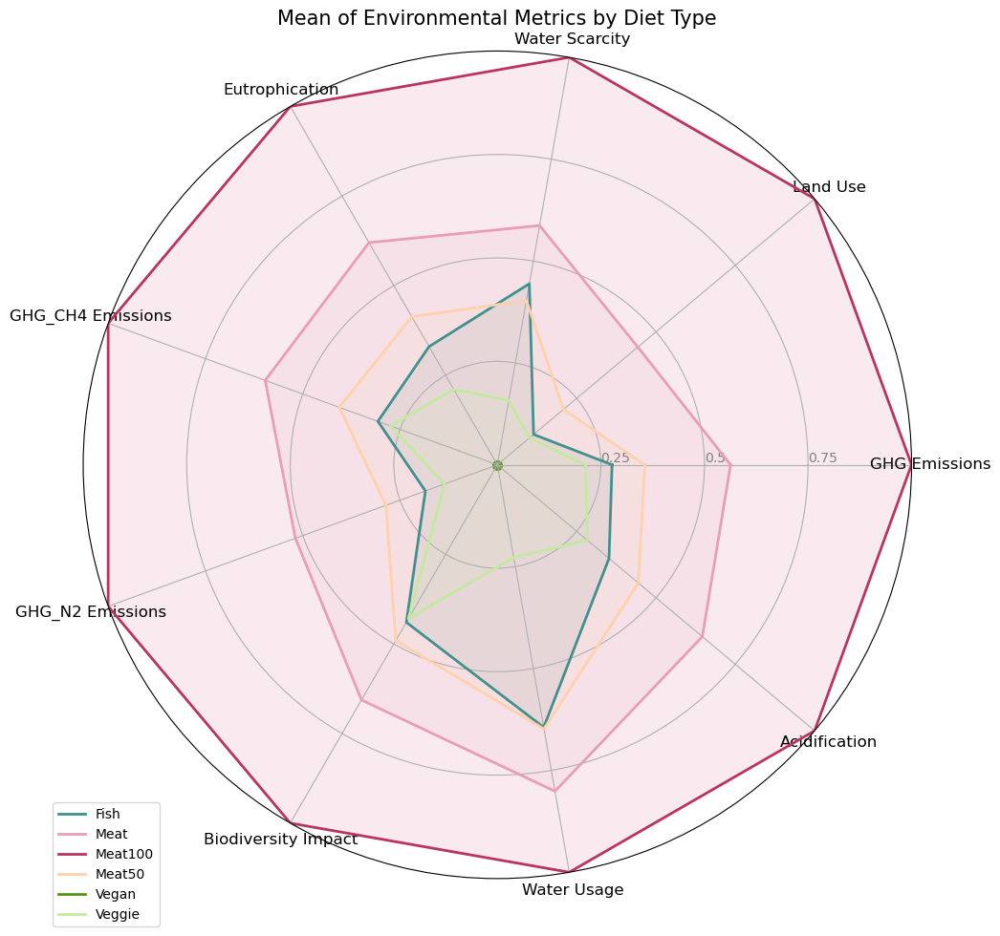

In [16]:
# Normalization
def normalize(df, columns):
    result = df.copy()
    for column in columns:
        max_value = df[column].max()
        min_value = df[column].min()
        result[column] = (df[column] - min_value) / (max_value - min_value)
    return result

diet_means_norm = normalize(diet_means, mean_label)

# Create radar plot
# Figure size
plt.figure(figsize=(12, 10))

# Number of variables
categories = ['GHG Emissions', 'Land Use', 'Water Scarcity', 
             'Eutrophication','GHG_CH4 Emissions','GHG_N2 Emissions', 'Biodiversity Impact', 'Water Usage', 'Acidification']
N = len(categories)

# The angle of each axis
angles = [n / float(N) * 2 * np.pi for n in range(N)]
angles += angles[:1]  # Close the loop

# Draw the plot
ax = plt.subplot(111, polar=True)

# Draw one axis per variable and add labels
plt.xticks(angles[:-1], categories, size=12)

# Draw ylabels
ax.set_rlabel_position(0)
plt.yticks([0.25, 0.5, 0.75], ["0.25", "0.5", "0.75"], color="grey", size=10)
plt.ylim(0, 1)

# Plot each diet type
for i, diet in enumerate(diet_means['diet_group']):
    values = diet_means_norm.loc[diet_means_norm['diet_group'] == diet, mean_label].values.flatten().tolist()
    values += values[:1]  # Close the loop
    ax.plot(angles, values, linewidth=2, linestyle='solid', label=diet.capitalize(), color=paletton_color.get(diet))
    ax.fill(angles, values, alpha=0.1, color=paletton_color.get(diet))
    
    if all(v == 0.0 for v in values):
        ax.scatter(angles[0], values[0], color=paletton_color.get(diet), s=50)

# Add legend
plt.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1))

# Add title
plt.title('Mean of Environmental Metrics by Diet Type', size=15, pad=20)

plt.tight_layout()
plt.show()

In [18]:
# Overall percentage impact
diet_means_norm = diet_means.copy()

# Normalize as a percentage of the maximum value (max = 100%)
for indicator in mean_label:
    max_val = diet_means[indicator].max()
    diet_means_norm[indicator] = (diet_means[indicator] / max_val) * 100

# Overall environmental impact score
diet_means_norm_overall = diet_means_norm.copy()
diet_means_norm_overall['overall_impact'] = diet_means_norm[mean_label].mean(axis=1)

# Sort by overall impact (lower is better)
diet_means_norm_overall = diet_means_norm_overall.sort_values('overall_impact')

# Create a bar chart
fig = px.bar(
    diet_means_norm_overall,
    x='diet_group',
    y='overall_impact',
    color='diet_group',
    color_discrete_sequence=[paletton_color[diet] for diet in diet_means_norm_overall['diet_group']],
    title='Overall Environmental Impact by Diet (Lower is Better)',
    labels={'overall_impact': 'Environmental Impact (% of Maximum)', 'diet_group': 'Diet Group'}
)

# Calculate standard deviation as percentage of maximum
normalized_std = diet_std.copy()
for indicator in mean_label:
    std_col = 'sd_' + indicator.replace('mean_', '')
    max_val = diet_means[indicator].max()
    normalized_std[std_col] = (diet_std[std_col] / max_val) * 100

# Calculate average normalized standard deviation as percentage
avg_std = normalized_std.iloc[:, 1:].mean(axis=1)

# Mapping to ensure same diet group order
avg_std_dict = dict(zip(normalized_std['diet_group'], avg_std))
error_values = [avg_std_dict[diet] for diet in diet_means_norm_overall['diet_group']]

# Add error bars
fig.update_traces(error_y=dict(
    type='data',
    array=error_values,
    visible=True
))

# Update layout
fig.update_layout(
    xaxis_title="Diet Group",
    yaxis_title="Environmental Impact (% of Maximum Impact)",
    template="plotly_white",
    height=600,
    width=800,
    # Add annotations to show exact percentage values
    annotations=[
        dict(
            x=diet,
            y=impact,
            text=f"{impact:.1f}%",
            showarrow=False,
            yshift=10,
            font=dict(color="black")
        ) for diet, impact in zip(diet_means_norm_overall['diet_group'], diet_means_norm_overall['overall_impact'])
    ]
)

fig.show()

In [26]:
from plotly.subplots import make_subplots
from scipy import stats


# 1000 Monte Carlo Mean KDE
# Figure with 3*3 Subplots
fig = make_subplots(rows=3, cols=3, subplot_titles=[ind.replace('mean_', '') for ind in mean_label])

diet_groups = agg_df['diet_group'].unique()

# KDE
for i, indicator in enumerate(mean_label):
    row = i // 3 + 1
    col = i % 3 + 1
    
    for j, diet in enumerate(diet_groups):
        # Get data for each diet group
        diet_data = agg_df[agg_df['diet_group'] == diet][indicator]
        
        # Calculate KDE
        x_range = np.linspace(min(diet_data), max(diet_data), 1000)
        kde = stats.gaussian_kde(diet_data)
        y_values = kde(x_range)
        
        # Get color from palette_color
        color = paletton_color.get(diet)
        # Set semi-transparent fill
        fill_color = 'rgba' + str(tuple(int(color.lstrip('#')[i:i+2], 16) for i in (0, 2, 4)) + (0.3,))
        
        # KDE trace
        fig.add_trace(
            go.Scatter(
                x=x_range,
                y=y_values,
                mode='lines',
                name=diet,
                line=dict(color=color, width=2),
                fill='tozeroy',
                fillcolor=fill_color,
                legendgroup=diet,
                showlegend=True if i == 0 else False,  # Only show in legend once
            ),
            row=row, col=col
        )
    
    # Update axes labels
    fig.update_xaxes(title_text=indicator.replace('mean_', ''), row=row, col=col)
    if col == 1: 
        fig.update_yaxes(title_text='Density', row=row, col=col)

# Update Layout
fig.update_layout(
    height=900,
    width=900,
    title_text='KDEs of Monte Carlo Means Across Environmental Indicators and Diet Groups',
    legend_title='Diet Group',
    template='plotly_white',
    font=dict(size=12)
)

fig.show()

In [29]:
grouped_df = df.groupby(['diet_group', 'sex', 'age_group']).agg({
    'mean_ghgs': 'mean',
    'n_participants': 'sum'  # Sum the number of participants in each group
}).reset_index()

# Create a treemap
fig = px.treemap(
    grouped_df,
    path=['diet_group', 'sex', 'age_group'],
    values='n_participants',
    color='mean_ghgs',
    color_continuous_scale='RdBu_r',
    hover_data=['mean_ghgs'],
    title='Environmental Impact (GHG Emissions) by Diet, Gender, and Age Group',
)

# Customize the treemap
fig.update_layout(
    coloraxis_colorbar=dict(
        title="GHG Emissions (kg)",
    ),
    margin=dict(t=50, l=25, r=25, b=25),
    height=600,
    width=1000
)

fig.show()

In [32]:
# Aggregate by diet group and gender
agg_data = diet_means

# Color map for different diet groups
diet_groups = agg_data['diet_group'].unique()
colors = ['#41908D','#E99EB6','#BB335E','#FFD1AD','#529515','#C3EA9F']
color_map = {diet: colors[i % len(colors)] for i, diet in enumerate(diet_groups)}

# The dimensions list
dimensions = []
for col in mean_label:
    dimensions.append(
        dict(
            range=[agg_data[col].min(), agg_data[col].max()],
            label=col.replace('mean_', '').capitalize(),
            values=agg_data[col]
        )
    )

# Create parallel coordinates plot
fig = go.Figure(data=go.Parcoords(
    line=dict(
        color=agg_data['diet_group'].apply(lambda x: diet_groups.tolist().index(x)),
        colorscale=[[i/(len(diet_groups)-1), colors[i % len(colors)]] for i in range(len(diet_groups))],
        showscale=True,
        colorbar=dict(
            tickvals=list(range(len(diet_groups))),
            ticktext=diet_groups
            )
        ),
        dimensions=dimensions
    )
)

# Update layout
fig.update_layout(
    title="Parallel Coordinates of Environmental Impact Metrics by Diet Type",
    font=dict(size=12),
    height=600,
    width=1000 
)

<Figure size 2000x1500 with 0 Axes>

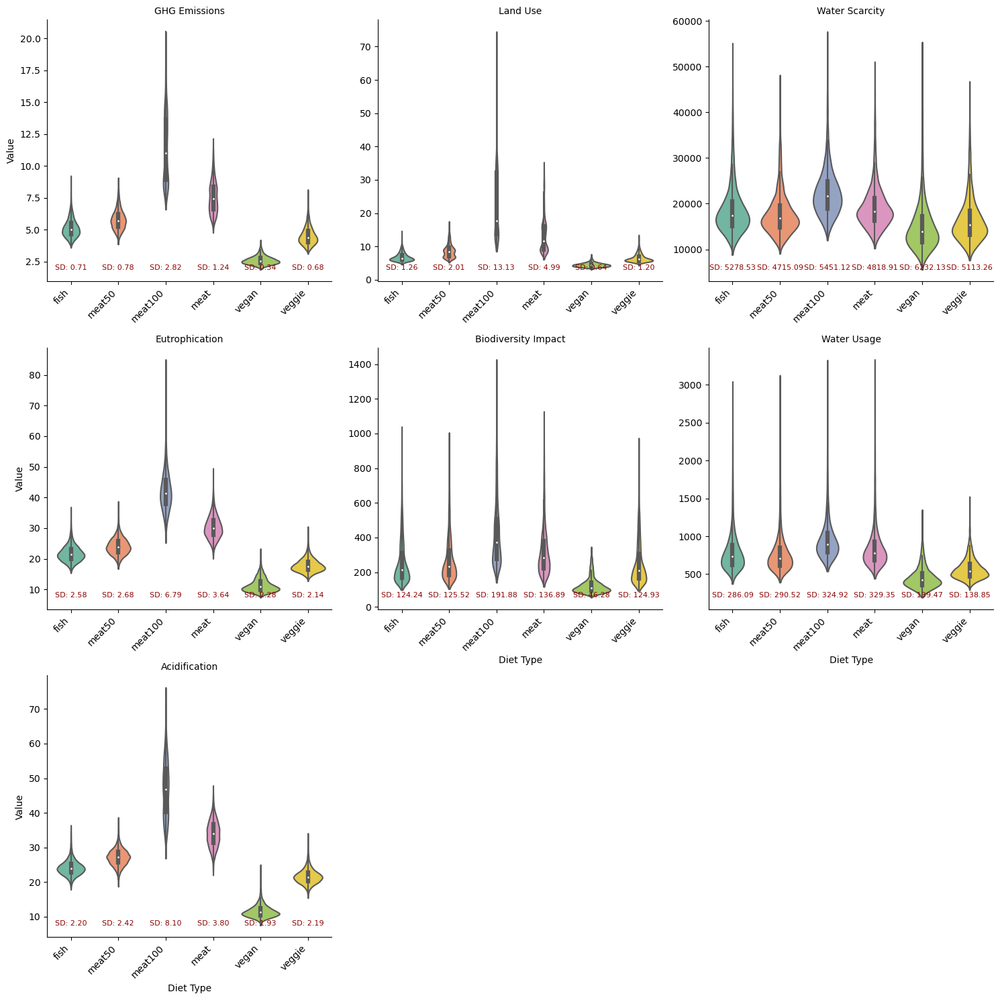

In [33]:
# List of metrics to analyze
metrics = ['mean_ghgs', 'mean_land', 'mean_watscar', 'mean_eut', 
           'mean_bio', 'mean_watuse', 'mean_acid']

# Pretty labels for the metrics
metric_labels = ['GHG Emissions', 'Land Use', 'Water Scarcity', 
                'Eutrophication', 'Biodiversity Impact', 
                'Water Usage', 'Acidification']

# Create a mapping for prettier labels
metric_mapping = dict(zip(metrics, metric_labels))

# Transform data from wide to long format for easier plotting
long_df = pd.melt(df, 
                id_vars=['diet_group', 'mc_run_id'], 
                value_vars=metrics, 
                var_name='metric', 
                value_name='value')

# Map the metric codes to pretty labels
long_df['metric'] = long_df['metric'].map(metric_mapping)

# Create the plot
plt.figure(figsize=(20, 15))

# Create a grid of subplots, one for each metric
g = sns.FacetGrid(long_df, col="metric", col_wrap=3, height=5, sharex=False, sharey=False)

# Draw a violin plot with boxplot inside for each metric
g.map_dataframe(sns.violinplot, x="diet_group", y="value", palette="Set2", inner="box", cut=0)

# Enhance the subplot aesthetics
g.set_axis_labels("Diet Type", "Value")
g.set_titles(col_template="{col_name}")

# Rotate x-axis labels for better readability
for ax in g.axes.flat:
    plt.setp(ax.get_xticklabels(), rotation=45, ha='right')
    
    # Add standard deviation as text for each diet group
    for i, diet in enumerate(df['diet_group'].unique()):
        # Extract the current metric from the subplot title
        current_metric = ax.get_title()
        # Find the corresponding original metric name
        original_metric = next(key for key, value in metric_mapping.items() if value == current_metric)
        # Calculate standard deviation
        std_val = df[df['diet_group'] == diet][original_metric].std()
        # Get the y-position (adjust as needed for your data)
        y_pos = long_df[long_df['metric'] == current_metric]['value'].min()
        # Add the text
        ax.text(i, y_pos, f'SD: {std_val:.2f}', ha='center', fontsize=8, color='darkred')

plt.tight_layout()
plt.show()